In [ ]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

* Upload Tatto.coco.zip
* Run code under once its uploaded

In [ ]:
!unzip -q ../content/Tatto_coco.zip -d ../

* Go up one level in the filesystem (double click folder with arrow icon and two dots to the right)
* Drag test, valid and train folder to content folder
* Run code under

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("test", {}, "/content/test/_annotations.coco.json", "/content/test")

* We visualize the training data

WARNING [03/19 14:52:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/19 14:52:17 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/train/_annotations.coco.json


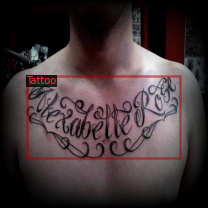

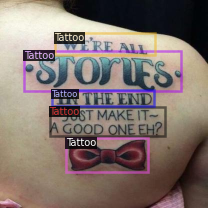

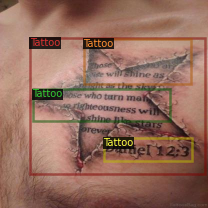

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("train")
dataset_dicts = DatasetCatalog.get("train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

* Training will start when running code under

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/19 14:54:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:21, 19.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[03/19 14:55:20 d2.engine.train_loop]: Starting training from iteration 0
[03/19 14:56:57 d2.utils.events]:  eta: 1:57:08  iter: 19  total_loss: 2.115  loss_cls: 1.024  loss_box_reg: 0.747  loss_rpn_cls: 0.312  loss_rpn_loc: 0.034  time: 4.8282  data_time: 0.0287  lr: 0.000020  max_mem: 7240M
[03/19 14:58:37 d2.utils.events]:  eta: 2:04:47  iter: 39  total_loss: 1.788  loss_cls: 0.777  loss_box_reg: 0.764  loss_rpn_cls: 0.203  loss_rpn_loc: 0.038  time: 4.9269  data_time: 0.0173  lr: 0.000040  max_mem: 7240M
[03/19 15:00:17 d2.utils.events]:  eta: 2:03:38  iter: 59  total_loss: 1.558  loss_cls: 0.604  loss_box_reg: 0.796  loss_rpn_cls: 0.131  loss_rpn_loc: 0.034  time: 4.9391  data_time: 0.0140  lr: 0.000060  max_mem: 7240M
[03/19 15:01:55 d2.utils.events]:  eta: 2:01:38  iter: 79  total_loss: 1.370  loss_cls: 0.504  loss_box_reg: 0.816  loss_rpn_cls: 0.046  loss_rpn_loc: 0.026  time: 4.9304  data_time: 0.0166  lr: 0.000080  max_mem: 7240M
[03/19 15:03:34 d2.utils.events]:  eta: 2:00:1

* When training finishes, run the remaining code sections in order

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [03/19 17:31:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/19 17:31:01 d2.data.datasets.coco]: Loaded 40 images in COCO format from /content/test/_annotations.coco.json
[03/19 17:31:01 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|   Tattoo   | 0            |   Tattoo   | 89           |
|            |              |            |              |
|   total    | 89           |            |              |
[03/19 17:31:01 d2.data.common]: Serializing 40 elements to byte tensors and concatenating them all ...
[03/19 17:31:01 d2.data.common]: Serialized dataset takes 0.01 MiB
[03/19 17:31:01 d2.evaluation.evaluator]: Start inference on 40 images
[03/19 17:31:08 d2.evaluation.evaluator]: Inference done 11/40. 0.5679 s / img. ETA=0:00:16
[03/19 17:31:13 d2.evaluation.evaluator]: 

OrderedDict([('bbox',
              {'AP': 25.544017560752515,
               'AP-Tattoo': 25.544017560752515,
               'AP50': 42.846333885741764,
               'AP75': 29.55109054330763,
               'APl': 47.795775976735534,
               'APm': 14.813424485480258,
               'APs': 0.0})])

In [ ]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1647701698.232919c2cf67.585.0  metrics.json
instances_predictions.pth                          model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("../test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("../test")

* Testing the model, it outputs the prediction images

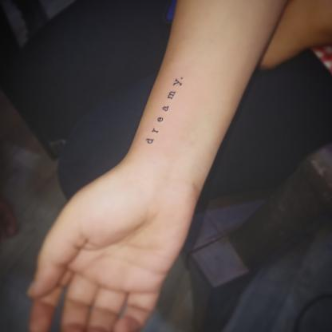

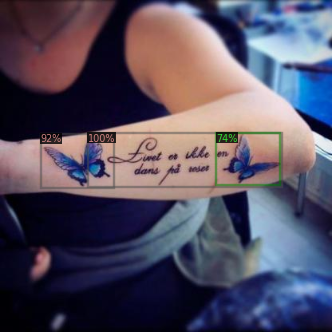

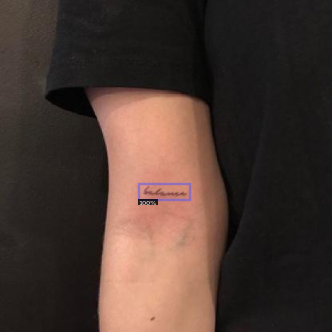

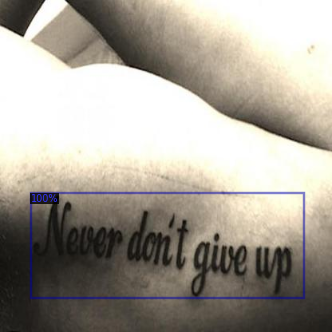

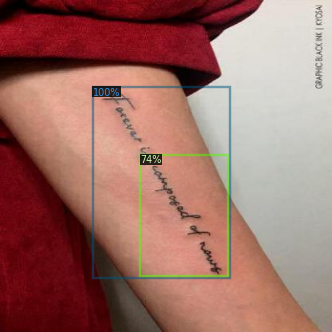

...

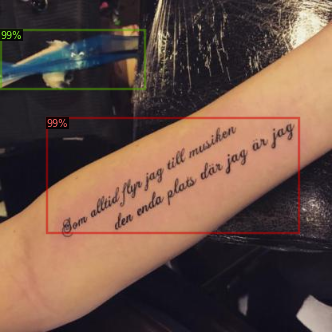

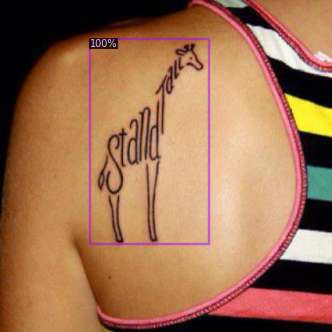

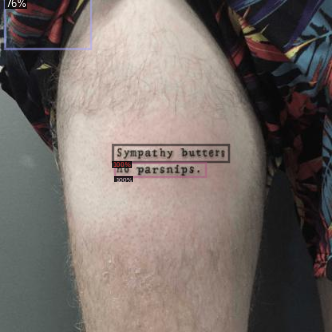

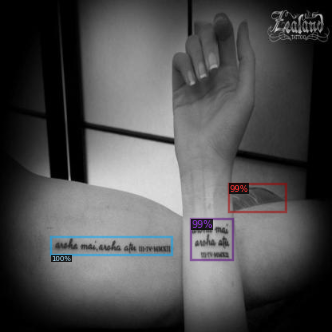

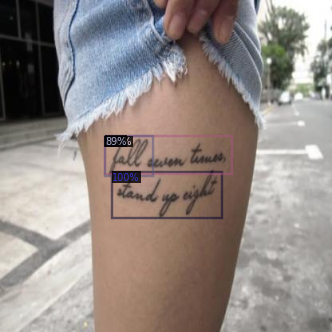

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])